<a href="https://colab.research.google.com/github/Zanderl1987/General/blob/master/Just_for_Fun.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%%capture
#!pip install investpy
#!pip install pyrtfolio
#!pip install trendet
!pip install parsel
#!python -m pip install mitoinstaller
#!python -m mitoinstaller install

In [2]:
import pandas as pd
import numpy as np
#import investpy
#import pyrtfolio
#import trendet
import requests
import matplotlib.pyplot as plt
import plotly
import seaborn as sns
import altair as alt
import re

In [23]:
import json
import asyncio
from httpx import AsyncClient, Response
from parsel import Selector

session = AsyncClient(headers={
    # use same headers as a popular web browser (Chrome on Windows in this case)
    "User-Agent": "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.114 Safari/537.36",
    "Accept": "text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9",
    "Accept-Language": "en-US,en;q=0.9",
})


def extract_cache(react_initial_context):
    """extract microservice cache data from the react server agent"""
    result = {}
    for name, cache in react_initial_context["ReactServerAgent.cache"]["dataCache"].items():
        # first we retrieve cached response and see whether it's a success
        try:
            cache_response = cache["res"]
        except KeyError:  # empty cache
            continue
        if cache_response.get("status") != 200:
            print("skipping non 200 cache")
            continue
        # then extract cached response body and interpret it as a JSON
        cache_data = cache_response.get("body", {}).get("payload")
        if not cache_data:
            cache_data = json.loads(cache_response["text"].split("&&", 1)[-1]).get("payload")
        if not cache_data:
            # skip empty caches
            continue
        # for Redfin we can cleanup cache names for home data endpoints:
        if "/home/details" in name:
            name = name.split("/home/details/")[-1]
        result[name.replace("/", "")] = cache_data
        # ^note: we sanitize name to avoid slashes as they are not allowed in JMESPath
    return result


def parse_property(response: Response):
    selector = Selector(response.text)
    script = selector.xpath('//script[contains(.,"ServerState.InitialContext")]/text()').get()
    initial_context = re.findall(r"ServerState.InitialContext = (\{.+\});", script)
    if not initial_context:
        print(f"page {response.url} is not a property listing page")
        return
    return extract_cache(json.loads(initial_context[0]))


async def scrape_properties(urls):
    to_scrape = [session.get(url) for url in urls]
    properties = []
    for response in asyncio.as_completed(to_scrape):
        properties.append(parse_property(await response))
    return properties

In [34]:
urls = [
    r"https://www.redfin.com/FL/Cape-Coral/402-SW-28th-St-33914/home/61856041",
    r"https://www.redfin.com/FL/Cape-Coral/4202-NW-16th-Ter-33993/home/62053611",
    r"https://www.redfin.com/FL/Cape-Coral/1415-NW-38th-Pl-33993/home/62079956",
]


for text in urls:
  result = await scrape_properties(text)
  print(result)



ValueError: ignored

In [3]:
fp = r"/content/RDC_Inventory_Core_Metrics_Zip_History.csv"

df1 = pd.read_csv(fp,low_memory=False)

In [4]:
df1.head()

,month_date_yyyymm,postal_code,zip_name,median_listing_price,median_listing_price_mm,median_listing_price_yy,active_listing_count,active_listing_count_mm,active_listing_count_yy,median_days_on_market,...,average_listing_price,average_listing_price_mm,average_listing_price_yy,total_listing_count,total_listing_count_mm,total_listing_count_yy,pending_ratio,pending_ratio_mm,pending_ratio_yy,quality_flag
0,202211,43148,"pleasantville, OH",250200.0,-0.0336,-0.0090,5.0,-0.1667,0.1111,35.0,...,330308.0,0.0952,0.0087,11.0,0.0500,0.0500,1.2000,0.5333,0.0889,1.0
1,202211,68310,"beatrice, NE",225000.0,0.2032,0.5010,25.0,-0.0385,0.3889,50.0,...,231472.0,0.1732,0.3805,42.0,-0.2170,-0.1531,0.6200,-0.4185,-1.0744,1.0
2,202211,55704,"askov, MN",299900.0,0.1539,-0.1431,0.0,-1.0000,-1.0000,57.0,...,299900.0,0.2430,-0.1431,1.0,-0.6667,-0.6667,NaN,NaN,NaN,1.0
3,202211,67218,"wichita, KS",133225.0,0.0658,0.0884,18.0,0.1250,-0.2800,30.0,...,153579.0,0.1347,0.0583,44.0,-0.0114,-0.3203,1.4444,-0.2431,-0.1156,0.0
4,202211,58575,"turtle lake, ND",220000.0,0.5172,-0.2000,5.0,-0.1667,0.6667,111.0,...,171740.0,0.1072,-0.2794,7.0,-0.2778,0.4444,0.3000,-0.2000,-0.2000,1.0


In [5]:
df1 = df1.fillna(value=0,axis=0)

In [6]:
df1.info()

TypeError: ignored

In [ ]:
filepath1 = '/content/RDC_Inventory_Core_Metrics_County.csv'

df1 = pd.read_csv(filepath1)

In [ ]:
df1.head()

,month_date_yyyymm,county_fips,county_name,median_listing_price,median_listing_price_mm,median_listing_price_yy,active_listing_count,active_listing_count_mm,active_listing_count_yy,median_days_on_market,...,average_listing_price,average_listing_price_mm,average_listing_price_yy,total_listing_count,total_listing_count_mm,total_listing_count_yy,pending_ratio,pending_ratio_mm,pending_ratio_yy,quality_flag
0,202211,29211,"sullivan, mo",169675.0,-0.1495,1.2654,17.0,0.2143,1.4286,74.0,...,325860.0,-0.1523,0.5305,18.0,0.2857,0.4400,0.0588,-0.0126,-0.6555,1.0
1,202211,42083,"mckean, pa",132450.0,0.0196,0.0134,70.0,-0.0789,0.1864,73.0,...,166195.0,-0.0266,-0.0555,104.0,-0.1375,-0.0282,0.4571,-0.0955,-0.3479,0.0
2,202211,44009,"washington, ri",649950.0,-0.0182,-0.0545,250.0,-0.0310,-0.0566,44.0,...,1277865.0,-0.0392,0.0992,499.0,-0.0759,-0.2104,0.9840,-0.1129,-0.4085,0.0
3,202211,48457,"tyler, tx",199225.0,0.0024,0.0139,115.0,-0.0214,0.6127,96.0,...,255391.0,-0.0015,0.0231,128.0,-0.0267,0.4167,0.1441,-0.0183,-0.2151,0.0
4,202211,54033,"harrison, wv",201975.0,0.0279,0.3031,118.0,0.0727,-0.0248,53.0,...,223445.0,-0.0268,-0.0071,209.0,0.0609,-0.0500,0.7669,-0.0603,-0.0678,1.0


In [ ]:
df1.sort_values(by='median_listing_price',ascending=False)

,month_date_yyyymm,county_fips,county_name,median_listing_price,median_listing_price_mm,median_listing_price_yy,active_listing_count,active_listing_count_mm,active_listing_count_yy,median_days_on_market,...,average_listing_price,average_listing_price_mm,average_listing_price_yy,total_listing_count,total_listing_count_mm,total_listing_count_yy,pending_ratio,pending_ratio_mm,pending_ratio_yy,quality_flag
2962,202211,25019,"nantucket, ma",4416250.0,-0.0389,0.1937,96.0,-0.0817,0.1369,130.0,...,6417197.0,-0.0365,0.2326,102.0,-0.0856,0.0464,0.0576,-0.0097,-0.0972,0.0
2914,202211,30033,"garfield, mt",4025000.0,0.0000,16.5000,2.0,0.0000,0.0000,77.0,...,4025000.0,0.0000,16.5000,2.0,0.0000,-0.3333,NaN,NaN,NaN,1.0
1651,202211,56039,"teton, wy",3672250.0,-0.0336,-0.0572,131.0,-0.1914,0.7013,112.0,...,5493517.0,-0.0278,-0.0679,183.0,-0.1368,0.3407,0.3893,0.0622,-0.3964,0.0
2596,202211,8113,"san miguel, co",2950000.0,-0.1748,-0.3055,132.0,-0.0504,0.3469,125.0,...,5528466.0,-0.0665,-0.2122,154.0,-0.1397,-0.0032,0.1818,-0.0916,-0.4049,1.0
572,202211,8097,"pitkin, co",2575000.0,-0.1121,0.0510,385.0,-0.0633,0.2164,144.0,...,6097175.0,-0.1177,-0.0057,385.0,-0.0633,0.2164,NaN,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2872,202211,31069,"garden, ne",45000.0,-0.2340,-0.3443,7.0,0.0000,0.1667,185.0,...,143024.0,-0.1999,0.0900,9.0,-0.2500,-0.1818,0.2857,-0.4286,-0.4643,1.0
2173,202211,48125,"dickens, tx",44000.0,-0.1200,0.1503,2.0,1.0000,0.0000,40.0,...,44000.0,-0.1200,0.1503,2.0,-0.5000,0.0000,0.0000,-3.0000,0.0000,0.0
2722,202211,2188,"northwest arctic, ak",29900.0,-0.2506,NaN,1.0,-0.5000,NaN,116.0,...,29900.0,-0.2506,NaN,1.0,-0.5000,NaN,NaN,NaN,NaN,0.0
2417,202211,28119,"quitman, ms",27413.0,-0.2145,-0.9046,2.0,-0.3333,0.0000,61.0,...,27413.0,-0.1491,-0.9046,2.0,-0.3333,-0.3333,0.2500,-0.0833,-0.2500,1.0


In [ ]:
df1['pct_reduced'] = (df1['price_reduced_count'] / df1['active_listing_count']) * 100
df1['pct_increased'] = (df1['price_increased_count'] / df1['active_listing_count']) * 100

In [ ]:
df1.head(30)

,month_date_yyyymm,county_fips,county_name,median_listing_price,median_listing_price_mm,median_listing_price_yy,active_listing_count,active_listing_count_mm,active_listing_count_yy,median_days_on_market,...,average_listing_price_yy,total_listing_count,total_listing_count_mm,total_listing_count_yy,pending_ratio,pending_ratio_mm,pending_ratio_yy,quality_flag,pct_reduced,pct_increased
0,202211,29211,"sullivan, mo",169675.0,-0.1495,1.2654,17.0,0.2143,1.4286,74.0,...,0.5305,18.0,0.2857,0.4400,0.0588,-0.0126,-0.6555,1.0,35.294118,0.000000
1,202211,42083,"mckean, pa",132450.0,0.0196,0.0134,70.0,-0.0789,0.1864,73.0,...,-0.0555,104.0,-0.1375,-0.0282,0.4571,-0.0955,-0.3479,0.0,14.285714,0.000000
2,202211,44009,"washington, ri",649950.0,-0.0182,-0.0545,250.0,-0.0310,-0.0566,44.0,...,0.0992,499.0,-0.0759,-0.2104,0.9840,-0.1129,-0.4085,0.0,20.800000,0.000000
3,202211,48457,"tyler, tx",199225.0,0.0024,0.0139,115.0,-0.0214,0.6127,96.0,...,0.0231,128.0,-0.0267,0.4167,0.1441,-0.0183,-0.2151,0.0,27.826087,0.000000
4,202211,54033,"harrison, wv",201975.0,0.0279,0.3031,118.0,0.0727,-0.0248,53.0,...,-0.0071,209.0,0.0609,-0.0500,0.7669,-0.0603,-0.0678,1.0,33.898305,1.694915
5,202211,18029,"dearborn, in",308750.0,-0.0040,0.3087,83.0,-0.0833,0.8750,50.0,...,0.0479,106.0,-0.0940,0.2848,0.2848,-0.0374,-0.5902,0.0,36.144578,0.000000
6,202211,42029,"chester, pa",599129.0,0.0278,0.1676,606.0,-0.0265,-0.0450,54.0,...,0.1875,1340.0,-0.0205,-0.2512,1.2164,-0.0119,-0.5896,0.0,32.343234,6.930693
7,202211,13001,"appling, ga",264900.0,0.1568,0.2495,27.0,0.1250,2.6000,66.0,...,0.3460,34.0,0.0968,1.3448,0.3148,-0.0185,-0.6185,1.0,22.222222,0.000000
8,202211,51047,"culpeper, va",507495.0,0.0151,0.1898,103.0,-0.1694,0.3377,78.0,...,0.0789,181.0,-0.0622,-0.1277,0.7330,0.1282,-0.9813,0.0,19.417476,7.766990
9,202211,22009,"avoyelles, la",135000.0,0.0000,-0.0844,79.0,0.0676,0.2061,96.0,...,-0.1481,103.0,-0.0049,0.1389,0.2848,-0.0530,-0.0740,0.0,17.721519,0.000000


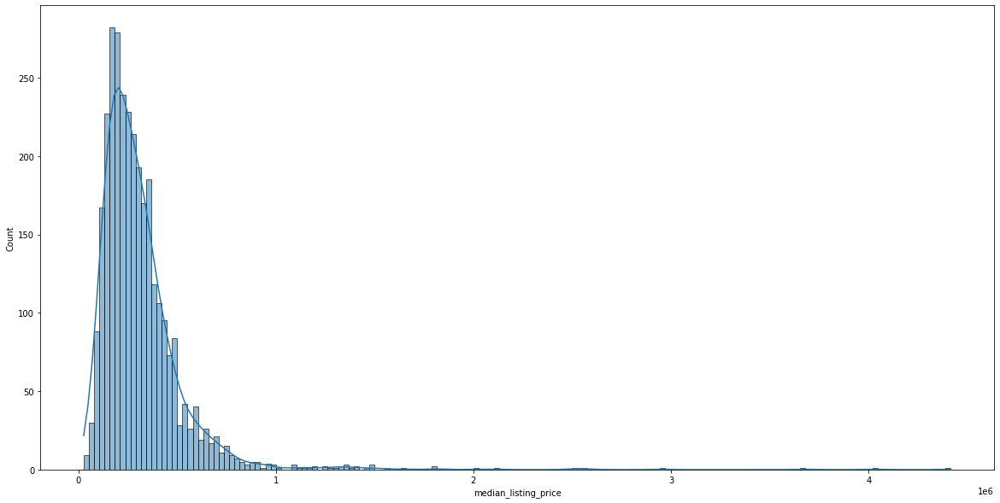

In [ ]:
f, ax = plt.subplots(figsize=(20,10))

sns.histplot(df1['median_listing_price'],kde=True, ax=ax)

In [ ]:
brush = alt.selection_interval(encodings=['x'])

base = alt.Chart(df1).mark_bar().encode(
    y='count():Q'
).properties(
    title='Median listing price up to Dec 1, 2022',
    width=1200,
    height=600
)

alt.vconcat(
    base.encode(
        alt.X('median_listing_price:Q',
              bin=alt.Bin(maxbins=100, extent=brush),
              scale=alt.Scale(domain=brush))
    )
),
base.encode(
    alt.X('median_listing_price:Q', bin=alt.Bin(maxbins=100)),
).add_selection(brush)


alt.Chart(...)

In [ ]:
brush = alt.selection_interval(encodings=['x'])

base = alt.Chart(df1).mark_bar().encode(
    y='count():Q'
).properties(
    title='Price increased count up to Dec 1, 2022',
    width=1200,
    height=600
)

alt.vconcat(
    base.encode(
        alt.X('price_increased_count:Q',
              bin=alt.Bin(maxbins=100, extent=brush),
              scale=alt.Scale(domain=brush))
    )
),
base.encode(
    alt.X('price_increased_count:Q', bin=alt.Bin(maxbins=100)),
).add_selection(brush)


alt.Chart(...)

In [ ]:
brush = alt.selection_interval(encodings=['x'])

base = alt.Chart(df1).mark_bar().encode(
    y='count():Q'
).properties(
    title='Price reduced count up to Dec 1, 2022',
    width=1200,
    height=600
)

alt.vconcat(
    base.encode(
        alt.X('price_reduced_count:Q',
              bin=alt.Bin(maxbins=100, extent=brush),
              scale=alt.Scale(domain=brush))
    )
),
base.encode(
    alt.X('price_reduced_count:Q', bin=alt.Bin(maxbins=100)),
).add_selection(brush)

alt.Chart(...)

In [ ]:
df1.sort_values(by='pct_reduced',ascending=False)

,month_date_yyyymm,county_fips,county_name,median_listing_price,median_listing_price_mm,median_listing_price_yy,active_listing_count,active_listing_count_mm,active_listing_count_yy,median_days_on_market,...,average_listing_price_yy,total_listing_count,total_listing_count_mm,total_listing_count_yy,pending_ratio,pending_ratio_mm,pending_ratio_yy,quality_flag,pct_reduced,pct_increased
2131,202211,30103,"treasure, mt",601200.0,-0.4927,0.2147,2.0,0.0000,0.0000,71.0,...,0.2147,3.0,0.2500,0.2500,0.5000,NaN,NaN,0.0,200.0,0.0
2349,202211,38073,"ransom, nd",88500.0,-0.2920,-0.3937,10.0,0.6667,0.0000,31.0,...,-0.4512,10.0,0.6667,0.0000,0.0500,NaN,NaN,1.0,80.0,0.0
2569,202211,31083,"harlan, ne",299900.0,-0.0164,1.0683,5.0,0.0000,-0.1667,137.0,...,0.0817,9.0,-0.1500,0.2143,0.6000,-0.200,0.4333,1.0,80.0,0.0
2396,202211,54095,"tyler, wv",159900.0,-0.0303,0.6006,10.0,0.1111,-0.3103,58.0,...,0.4490,20.0,0.0263,-0.1875,1.0000,0.000,0.3103,1.0,80.0,0.0
143,202211,19009,"audubon, ia",139375.0,0.0347,-0.1137,10.0,-0.2083,-0.2083,37.0,...,-0.2000,24.0,-0.0208,-0.0208,1.5263,0.443,0.5680,1.0,80.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3111,202211,46069,"hyde, sd",245875.0,0.1864,NaN,2.0,0.0000,NaN,243.0,...,NaN,3.0,0.0000,NaN,0.5000,0.000,NaN,0.0,0.0,0.0
466,202211,20179,"sheridan, ks",195000.0,NaN,1.4920,0.0,NaN,-1.0000,195.0,...,1.4920,1.0,NaN,-0.5000,NaN,NaN,NaN,1.0,NaN,NaN
576,202211,20199,"wallace, ks",69700.0,-0.4512,-0.4424,0.0,NaN,-1.0000,206.0,...,-0.5720,1.0,-0.5000,-0.6000,NaN,NaN,NaN,1.0,NaN,NaN
2921,202211,20033,"comanche, ks",55000.0,0.0000,-0.4051,0.0,-1.0000,-1.0000,95.0,...,-0.4659,1.0,-0.5000,-0.8750,NaN,NaN,NaN,1.0,NaN,NaN
